<a href="https://colab.research.google.com/github/SebasGarcia08/sku110-dense-object-mmdetection/blob/develop/notebooks/finetunning_sku110.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
"""
Verify GPU 
"""
!nvidia-smi

Thu May  6 20:38:29 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0


# Installing  mmcv and mmdet

In [ ]:
!pip list | grep "torch"

torch                         1.8.1+cu101   
torchsummary                  1.5.1         
torchtext                     0.9.1         
torchvision                   0.9.1+cu101   


In [ ]:
!pip uninstall mmcv mmdet -y 
!pip install mmcv-full mmdet 

     |████████████████████████████████| 286kB 19.3MB/s 
     |████████████████████████████████| 593kB 50.9MB/s 
     |████████████████████████████████| 194kB 53.5MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.3.3-cp37-cp37m-linux_x86_64.whl size=24519632 sha256=b04a0f517fb607f667a0b2a143ce67ec476ac3742e756b70154e9e42de63d063
  Stored in directory: /root/.cache/pip/wheels/57/2a/55/762bce3ae6e1ef4eee0419cefa3229a6d30892e058345629f4
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp37-none-any.whl size=15356 sha256=e2f52c6cd9d2a603f774c6d13d4f3bb888a85f6b9b2c598cf804763954fba28e
  Stored in directory: /root/.cache/pip/wheels/30/6b/50/6c75775b681fb36cdfac7f19799888ef9d8813aff9e379663e
Successfully built mmcv-full terminaltables


In [ ]:
!pip list | grep "mmcv\|mmdet\|torch"

mmcv-full                     1.3.3         
mmdet                         2.12.0        
torch                         1.8.1+cu101   
torchsummary                  1.5.1         
torchtext                     0.9.1         
torchvision                   0.9.1+cu101   


# Instalation verification

Cloning into 'mmdetection'...
remote: Enumerating objects: 17523, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 17523 (delta 0), reused 3 (delta 0), pack-reused 17518
Receiving objects: 100% (17523/17523), 21.15 MiB | 34.00 MiB/s, done.
Resolving deltas: 100% (12192/12192), done.
--2021-05-06 20:50:49--  http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.35
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.35|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167287506 (160M) [application/octet-stream]
Saving to: ‘./mmdetection/checkpoints/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth’

./mmdetection/check 100%[===================>] 159.54M  8.75MB/s    in 19s     

2021-05-06 20:51:08 (8.60 MB/s) - ‘./mmdetection/checkp

/usr/local/lib/python3.7/dist-packages/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


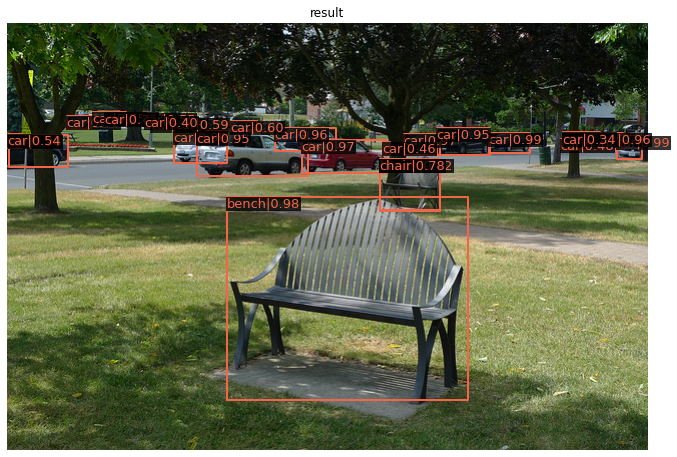

In [ ]:
"""
Clone mmdetection repo
"""
!git clone https://github.com/open-mmlab/mmdetection
config_file = './mmdetection/configs/faster_rcnn/faster_rcnn_r50_fpn_1x_coco.py'
checkpoint_file = './mmdetection/checkpoints/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'
checkpoint_download_link = "http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth"
test_img = './mmdetection/demo/demo.jpg'

"""
Download the checkpoint from model zoo and put it in `checkpoints/`
"""

# !cd mmdetection/ && mkdir checkpoints : enter to mmdetection directory and crate checkpoints folder
!cd mmdetection/ && mkdir checkpoints
# Download cehckpoints from {checkpoint_download_link} and place them in {checkpoint_file} 
# if does not exists already (--no-clobber)
!wget -O {checkpoint_file} --no-clobber {checkpoint_download_link}

from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv

device = 'cuda:0'
# init a detector
model = init_detector(config_file, checkpoint_file, device=device)
# inference the demo image
result = inference_detector(model, test_img)
show_result_pyplot(model, test_img, result)
!rm -r mmdetection

# Run


# Download weights

## Get dataset from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ls /content/gdrive/MyDrive/Datasets/sku110/images/
!ls /content/gdrive/MyDrive/Datasets/sku110/annotations/

Mounted at /content/gdrive
test  train  val
test.json  train.json  val.json


## Download old weights

## Clone repository

In [ ]:
!git clone https://github.com/SebasGarcia08/sku110-dense-object-mmdetection
REPO_DIR = '/content/sku110-dense-object-mmdetection'
config_file = f"{REPO_DIR}/configs/DenseDet_SKU_fusion_bfp_x101_32x4d_v2.py"
!ls {config_file}

fatal: destination path 'sku110-dense-object-mmdetection' already exists and is not an empty directory.
/content/sku110-dense-object-mmdetection/configs/DenseDet_SKU_fusion_bfp_x101_32x4d_v2.py


## Download official weights

In [ ]:
!pip install -U -q PyDrive 

from pydrive.auth import GoogleAuth 
from pydrive.drive import GoogleDrive 
from google.colab import auth 
from oauth2client.client import GoogleCredentials

In [ ]:
%cd /content/
auth.authenticate_user() 
gauth = GoogleAuth() 
gauth.credentials = GoogleCredentials.get_application_default() 
drive = GoogleDrive(gauth)

# Weights link can is accessed in this repo https://github.com/Media-Smart/SKU110K-DenseDet
checkpoints_download_link = 'https://drive.google.com/file/d/1XM8OzRdcbDbSrvlcMgJsFX76lBmdN2Td/view?usp=sharing' # to get the id part of the file 
checkpoints_name = "DenseDet_SKU_fusion_bfp_x101_32x4d"
checkpoints_file = f"{REPO_DIR}/checkpoints/{checkpoints_name}_v1.pth"

id = checkpoints_download_link.split("/")[-2] 
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile(checkpoints_file) 
!ls {checkpoints_file}

/content
/content/sku110-dense-object-mmdetection/checkpoints/DenseDet_SKU_fusion_bfp_x101_32x4d_v1.pth


## Update official weights to 2.x version of MMDetect

In [ ]:
updated_checkpoints_file = f"{REPO_DIR}/checkpoints/{checkpoints_name}_v2.pth"
!python {REPO_DIR}/tools/model_converters/upgrade_model_version.py {checkpoints_file} {updated_checkpoints_file}
!ls {updated_checkpoints_file}

reorder cls channels of rpn_head.rpn_cls.weight
reorder cls channels of rpn_head.rpn_cls.bias
reorder cls channels of roi_head.bbox_head.0.fc_cls.weight
reorder cls channels of roi_head.bbox_head.0.fc_cls.bias
reorder cls channels of roi_head.bbox_head.1.fc_cls.weight
reorder cls channels of roi_head.bbox_head.1.fc_cls.bias
/content/sku110-dense-object-mmdetection/checkpoints/DenseDet_SKU_fusion_bfp_x101_32x4d_v2.pth


# Perform inference

In [ ]:
!mkdir test_imgs
!wget -O test_imgs/test0.jpg --no-clobber https://github.com/Media-Smart/SKU110K-DenseDet/raw/master/preview.jpg
!wget -O test_imgs/test1.jpg --no-clobber https://media.gettyimages.com/photos/colombia-cartagena-la-matuna-exito-mercado-breakfast-cereal-aisle-picture-id1164925803?s=612x612
!wget -O test_imgs/test2.jpg --no-clobber https://c8.alamy.com/compes/t04wc7/colombia-cartagena-centro-de-la-ciudad-amurallada-vieja-la-matuna-exito-mercado-interior-supermercado-venta-de-exhibicion-de-alimentos-shel-t04wc7.jpg
!wget -O test_imgs/test3.jpg --no-clobber https://thumbs.dreamstime.com/b/orange-soda-juice-bottles-supermarket-stand-bucharest-romania-march-51432750.jpg
!wget -O test_imgs/test4.jpg --no-clobber https://previews.123rf.com/images/asphoto777/asphoto7771812/asphoto777181201882/114098873-kyiv-ukraine-december-19-2018-different-bottles-of-beer-on-supermarket-stand-shelves-.jpg
!wget -O test_imgs/test5.jpg --no-clobber https://previews.123rf.com/images/opasstudio/opasstudio1811/opasstudio181100025/136770399-bangkok-thailand-october-27-beer-rack-many-brands-on-supermarket-stand-various-bottles-and-cans-of-t.jpg
!wget -O test_imgs/test6.jpg --no-clobber https://media.malaymail.com/uploads/articles/2018/2018-09/sdrinktaxc0409.jpg
!wget -O test_imgs/test7.jpg --no-clobber https://previews.123rf.com/images/radub85/radub851503/radub85150300026/37181271-bucharest-romania-february-28-2015-soda-drinks-on-supermarket-stand-.jpg

Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([2, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([2]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([2, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([2]) from checkpoint, the shape in current model is torch.Size([3]).


/usr/local/lib/python3.7/dist-packages/mmdet/models/dense_heads/rpn_head.py:192: UserWarning: In rpn_proposal or test_cfg, nms_thr has been moved to a dict named nms as iou_threshold, max_num has been renamed as max_per_img, name of original arguments and the way to specify iou_threshold of NMS will be deprecated.
  'In rpn_proposal or test_cfg, '


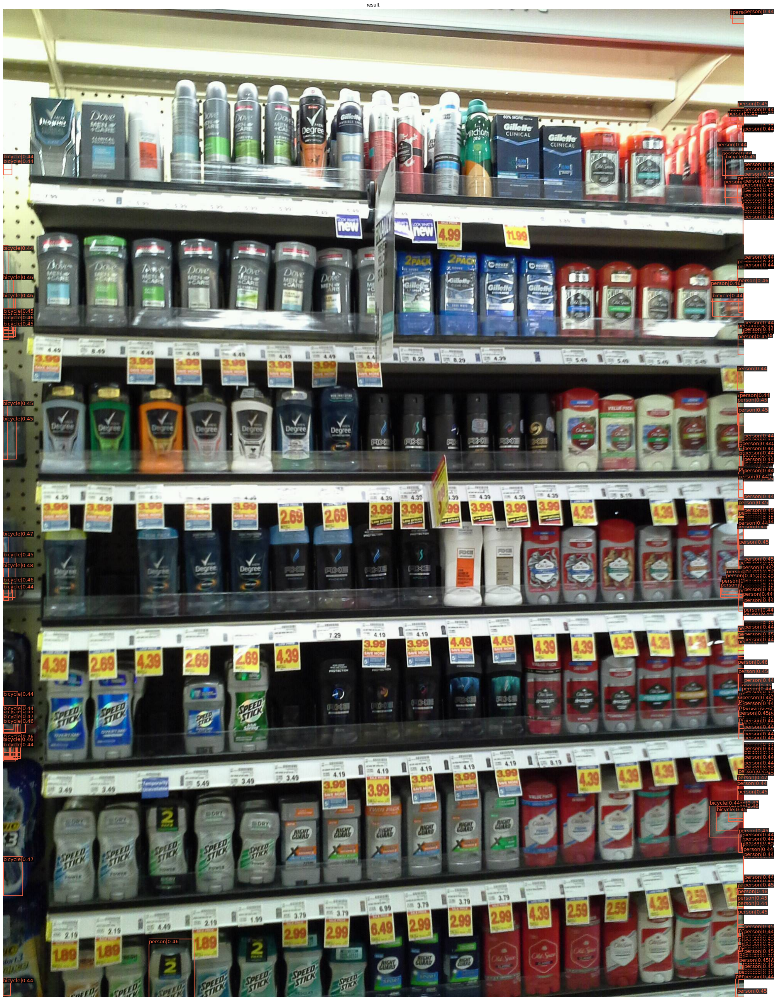

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import matplotlib.pyplot as plt
import mmcv

# inference the demo image
test = "test.jpg"


num_img = 2

def do_inference(b):
  clear_output(wait=True)
  global num_img
  try:
    del(model)
  except: 
    pass
  #img_dir = f"./test_imgs/test_{}.jpg"
  img_dir = './gdrive/MyDrive/Datasets/sku110/images/test'
  img_path = f"{img_dir}/test_{num_img}.jpg"
  model = init_detector(config_file, updated_checkpoints_file, device='cuda:0')
  result = inference_detector(model, img_path)
  show_result_pyplot(model, img_path, result, score_thr=0.3)
  num_img += 1
  plt.show()
  
button = widgets.Button(description="Next image!")
output = widgets.Output()

button.on_click(do_inference)
display(button, output)

# Run test

In [ ]:
import torch
torch.cuda.empty_cache()
try:
  del(model)
except:
  pass
!python {REPO_DIR}/tools/test.py {config_file} \
    {updated_checkpoints_file} \
    --eval bbox s mAP 

loading annotations into memory...
Done (t=2.66s)
creating index...
index created!
Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([2, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([2]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([2, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([2]) from checkpoint, the shape in current model is torch.Size([3]).
[                                                  ] 0/2936, elapsed: 0s, ETA:/usr/local/lib/python3.7/dist-packages/mmdet/models/dense_heads/rpn_head.py:192: UserWarning: 

# Training

In [ ]:
!python {REPO_DIR}/tools/train.py "./sku110-dense-object-mmdetection/configs/DenseDet_SKU_fusion_bfp_x101_32x4d_v2.py"

fatal: not a git repository (or any of the parent directories): .git
2021-05-06 22:47:26,404 - mmdet - INFO - Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.7.10 (default, Feb 20 2021, 21:17:23) [GCC 7.5.0]
CUDA available: True
GPU 0: Tesla T4
CUDA_HOME: /usr/local/cuda
NVCC: Build cuda_11.0_bu.TC445_37.28845127_0
GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
PyTorch: 1.8.1+cu101
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v1.7.0 (Git Hash 7aed236906b1f7a05c0917e5257a1af05e9ff683)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 10.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,cod

In [ ]:
!cat /usr/local/lib/python3.7/dist-packages/mmcv/utils/registry.py

import inspect
import warnings
from functools import partial

from .misc import is_seq_of


def build_from_cfg(cfg, registry, default_args=None):
    """Build a module from config dict.

    Args:
        cfg (dict): Config dict. It should at least contain the key "type".
        registry (:obj:`Registry`): The registry to search the type from.
        default_args (dict, optional): Default initialization arguments.

    Returns:
        object: The constructed object.
    """
    if not isinstance(cfg, dict):
        raise TypeError(f'cfg must be a dict, but got {type(cfg)}')
    if 'type' not in cfg:
        if default_args is None or 'type' not in default_args:
            raise KeyError(
                '`cfg` or `default_args` must contain the key "type", '
                f'but got {cfg}\n{default_args}')
    if not isinstance(registry, Registry):
        raise TypeError('registry must be an mmcv.Registry object, '
                        f'but got {type(registry)}')
    if not (